# Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import os
import time
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import pydicom as dicom
import pydicom
import json
import glob
import collections
from pydicom.pixel_data_handlers.util import apply_voi_lut
import cv2
from skimage import measure
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import plotly.graph_objects as go
import random
import warnings
warnings.filterwarnings('ignore')

# Exploratory Data Analysis(EDA)
Load & | |Read Data

In [2]:
label_coordinates_df = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_label_coordinates.csv')
train_series = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_series_descriptions.csv')
df_train = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train.csv')
df_sub = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/sample_submission.csv')
test_series = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/test_series_descriptions.csv')

In [3]:
label_coordinates_df.head()

,study_id,series_id,instance_number,condition,level,x,y
0,4003253,702807833,8,Spinal Canal Stenosis,L1/L2,322.831858,227.964602
1,4003253,702807833,8,Spinal Canal Stenosis,L2/L3,320.571429,295.714286
2,4003253,702807833,8,Spinal Canal Stenosis,L3/L4,323.030303,371.818182
3,4003253,702807833,8,Spinal Canal Stenosis,L4/L5,335.292035,427.327434
4,4003253,702807833,8,Spinal Canal Stenosis,L5/S1,353.415929,483.964602


In [4]:
label_coordinates_df.shape

(48692, 7)

In [5]:
label_coordinates_df.tail

<bound method NDFrame.tail of          study_id   series_id  instance_number  \
0         4003253   702807833                8   
1         4003253   702807833                8   
2         4003253   702807833                8   
3         4003253   702807833                8   
4         4003253   702807833                8   
...           ...         ...              ...   
48687  4290709089  4237840455               11   
48688  4290709089  4237840455               12   
48689  4290709089  4237840455               12   
48690  4290709089  4237840455               12   
48691  4290709089  4237840455               12   

                             condition  level           x           y  
0                Spinal Canal Stenosis  L1/L2  322.831858  227.964602  
1                Spinal Canal Stenosis  L2/L3  320.571429  295.714286  
2                Spinal Canal Stenosis  L3/L4  323.030303  371.818182  
3                Spinal Canal Stenosis  L4/L5  335.292035  427.327434  
4        

# Loading Image

In [6]:
folder_path = '/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/100206310/1012284084'
dicom_files = [f for f in os.listdir(folder_path) if f.endswith('.dcm')]

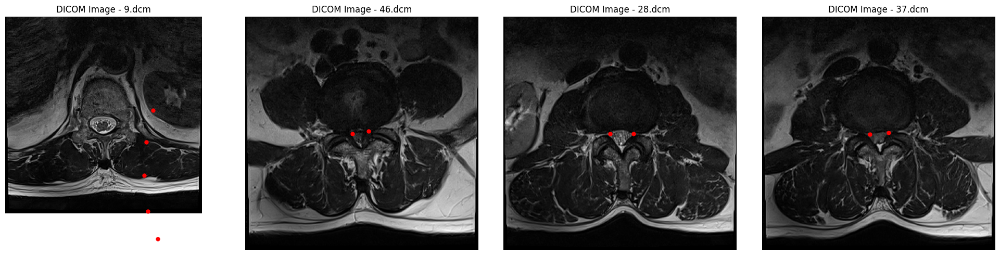

In [7]:
folder_path = '/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/100206310/1012284084'
dicom_files = [f for f in os.listdir(folder_path) if f.endswith('.dcm')]
label_coordinates_df = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_label_coordinates.csv')

study_id = folder_path.split('/')[-2]
study_label_coordinates = label_coordinates_df[label_coordinates_df['study_id'] == int(study_id)]
filtered_dicom_files = []
filtered_label_coordinates = []

for dicom_file in dicom_files:
    instance_number = int(dicom_file.split('.')[0])
    corresponding_coordinates = study_label_coordinates[study_label_coordinates['instance_number'] == instance_number]
    if not corresponding_coordinates.empty:
        filtered_dicom_files.append(dicom_file)
        filtered_label_coordinates.append(corresponding_coordinates)
fig, axs = plt.subplots(1, 4, figsize=(20, 5))
second_row_index = 1
second_row_images = filtered_dicom_files[second_row_index : second_row_index + 4]
second_row_coordinates = filtered_label_coordinates[second_row_index : second_row_index + 4]

for i, (dicom_file, label_coordinates) in enumerate(zip(second_row_images, second_row_coordinates)):
    dicom_file_path = os.path.join(folder_path, dicom_file)
    dicom_data = pydicom.dcmread(dicom_file_path)
    image = dicom_data.pixel_array   
    axs[i].imshow(image, cmap='gray')
    axs[i].set_title(f'DICOM Image - {dicom_file}')
    axs[i].axis('off')   
    for _, row in label_coordinates.iterrows():
        axs[i].plot(row['x'], row['y'], 'ro', markersize=5) 
        
plt.tight_layout()
plt.show()

In [8]:
df_train.head()

,study_id,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,spinal_canal_stenosis_l4_l5,spinal_canal_stenosis_l5_s1,left_neural_foraminal_narrowing_l1_l2,left_neural_foraminal_narrowing_l2_l3,left_neural_foraminal_narrowing_l3_l4,left_neural_foraminal_narrowing_l4_l5,...,left_subarticular_stenosis_l1_l2,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1
0,4003253,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
1,4646740,Normal/Mild,Normal/Mild,Moderate,Severe,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Normal/Mild,Normal/Mild,Severe,Normal/Mild,Normal/Mild,Moderate,Moderate,Moderate,Normal/Mild
2,7143189,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
3,8785691,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
4,10728036,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild


In [9]:
df_train.tail()

,study_id,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,spinal_canal_stenosis_l4_l5,spinal_canal_stenosis_l5_s1,left_neural_foraminal_narrowing_l1_l2,left_neural_foraminal_narrowing_l2_l3,left_neural_foraminal_narrowing_l3_l4,left_neural_foraminal_narrowing_l4_l5,...,left_subarticular_stenosis_l1_l2,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1
1970,4282019580,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Moderate,Moderate
1971,4283570761,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
1972,4284048608,Normal/Mild,Normal/Mild,Normal/Mild,Severe,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Severe,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Severe,Normal/Mild
1973,4287160193,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Severe,Moderate,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Moderate,Normal/Mild
1974,4290709089,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild


In [10]:
def load_dicom(path):
    dicom = pydicom.read_file(path)
    data = dicom.pixel_array
    data = data - np.min(data)
    if np.max(data) != 0:
        data = data / np.max(data)
    data = (data * 255).astype(np.uint8)
    return data

In [11]:
from matplotlib import animation, rc
rc('animation', html='jshtml')


def create_animation(ims):
    fig = plt.figure(figsize=(6, 6))
    plt.axis('off')
    im = plt.imshow(ims[0], cmap="gray")

    def animate_func(i):
        im.set_array(ims[i])
        return [im]

    return animation.FuncAnimation(fig, animate_func, frames = len(ims), interval = 1000//24)

In [12]:
def load_dicom_line(path):
    t_paths = sorted(
        glob.glob(os.path.join(path, "*")), 
        key=lambda x: int(os.path.splitext(os.path.basename(x))[0].split("-")[-1]),
    )
    images = []
    for filename in t_paths:
        data = load_dicom(filename)
        if data.max() == 0:
            continue
        images.append(data)
        
    return images

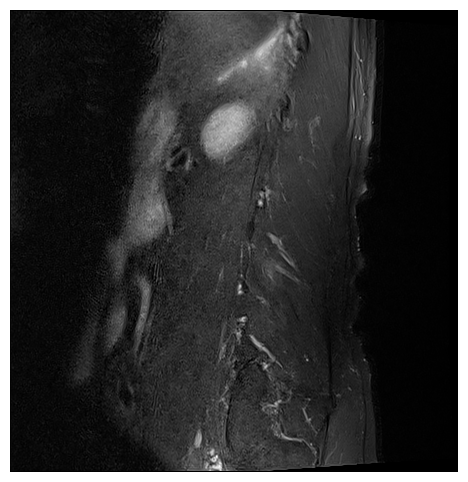

In [13]:
images = load_dicom_line("/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/100206310/1792451510")
create_animation(images)

In [14]:
import os
import pydicom
from glob import glob


def read_dicom_files(path_to_folder):
    files_glob = os.path.join(path_to_folder, "*.dcm")
    sorted_files = sorted(glob(files_glob), key=lambda f: int(f.split('/')[-1].split('-')[-1].split('.')[0]))
    return [pydicom.read_file(f) for f in sorted_files[:5]]

def calculate_level(mean, std):
    return mean + 1.7 * std

def stats_image(image):
    noncero_pixels = image[np.nonzero(image)]
    if noncero_pixels.shape == (0,):
        mean = 0
        std = 0
    else:
        mean = np.mean(noncero_pixels)
        std = np.std(noncero_pixels)
    return (mean, std)

def image_orientation(dicom):
    rt = 'unkown'
    (x1, y1, _, x2, y2, _) = [round(v) for v in dicom.ImageOrientationPatient]
    if (x1, y1, x2, y2) == (1, 0, 0, 0):
        rt = 'coronal'
    if (x1, y1, x2, y2) == (1, 0, 0, 1):
        rt = 'axial'
    if (x1, y1, x2, y2) == (0, 1, 0, 0):
        rt = 'sagittal'
    if rt == 'unkown':
        raise ValueError(f'unkown ImageOrientationPatient: {dicom.ImageOrientationPatient}')
    return rt

def plot_image_hist(image):
    (mean, std) = stats_image(image) 
    pixels = image.ravel()
    noncero_pixels = pixels[np.nonzero(pixels)]
    noncero_pixels = (noncero_pixels - mean) / std
    over_threshold = np.count_nonzero(noncero_pixels > calculate_level(mean, std))
    
    fig, (axi, axh) = plt.subplots(1, 2, figsize=(20, 3), gridspec_kw={'width_ratios': [1, 4]})
    fig.suptitle(f'scan # ({over_threshold})')
    
    axh.hist(noncero_pixels, 200, range=(-5, 5))  
    axh.set_xlim(-5, 5)

    ax_limits = axh.get_ylim()
    axh.vlines(mean, ymin=ax_limits[0], ymax=ax_limits[1], colors='r', label='Mean')
    axh.vlines(mean + std, ymin=ax_limits[0], ymax=ax_limits[1], colors='g', linestyles='dotted', label='Mean + Std')
    axh.vlines(calculate_level(mean, std), ymin=ax_limits[0], ymax=ax_limits[1], colors='b', linestyles='dashed', label='Threshold')

    axi.imshow(image, cmap=plt.cm.gray)
    axi.grid(False)
    axi.axis('off')
    axh.legend()
    plt.show()

In [15]:
path_to_folder = "/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/100206310/1012284084"

dicom_files = read_dicom_files(path_to_folder)

In [16]:
import plotly.express as px

def read_dicom_files(path_to_folder):
    files_glob = os.path.join(path_to_folder, "*.dcm")
    sorted_files = sorted(glob(files_glob), key=lambda f: int(f.split('/')[-1].split('.')[0]))
    return [pydicom.read_file(f) for f in sorted_files]

def get_flair_images(dicom_files):
    images = [s.pixel_array for s in dicom_files]
    return np.array(images)

path_to_folder = "/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/100206310/1012284084"
dicom_files = read_dicom_files(path_to_folder)
flair_images = get_flair_images(dicom_files)
fig = px.imshow(flair_images, animation_frame=0, binary_string=True, labels=dict(x="FLAIR Images", animation_frame="Scan"), height=800)
fig.show()

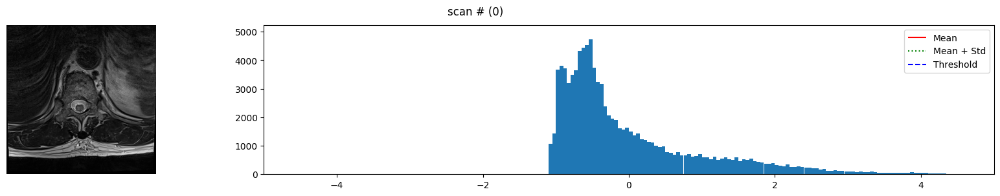

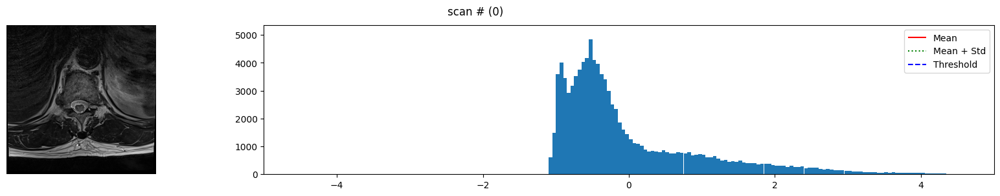

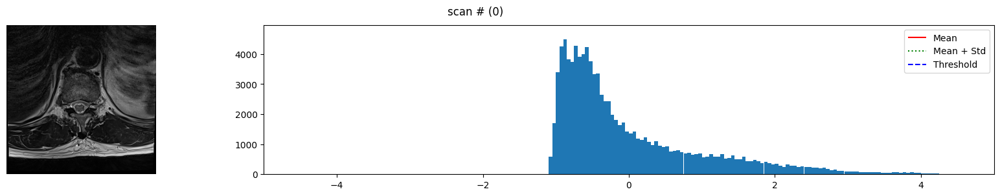

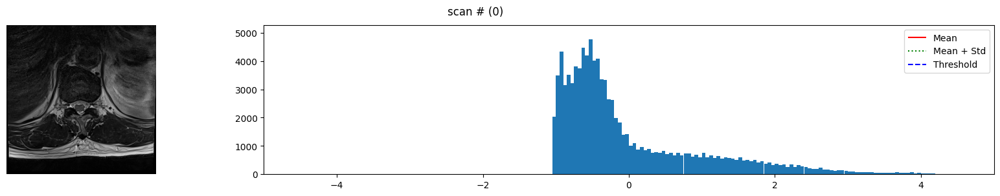

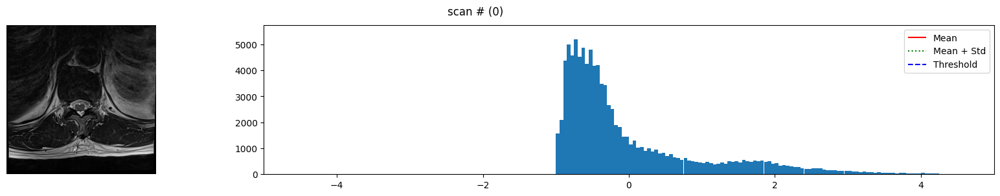

In [17]:
for img in flair_images[:5]:
    plot_image_hist(img)


In [18]:
dicom_files[1]

Dataset.file_meta -------------------------------
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Enhanced MR Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 100206310.1.2
(0002, 0010) Transfer Syntax UID                 UI: RLE Lossless
(0002, 0012) Implementation Class UID            UI: 1.2.40.0.13.1.1.1
(0002, 0013) Implementation Version Name         SH: 'PYDICOM 2.4.2'
-------------------------------------------------
(0008, 0018) SOP Instance UID                    UI: 100206310.1.2
(0008, 0023) Content Date                        DA: '20240503'
(0008, 0033) Content Time                        TM: '223744.975695'
(0008, 103e) Series Description                  LO: 'T2'
(0010, 0020) Patient ID                          LO: '100206310'
(0018, 0050) Slice Thickness                     DS: '3.5'
(0018, 0088) Spacing Between Slices              DS: '3.5'
(0018, 5100) Patient Position             

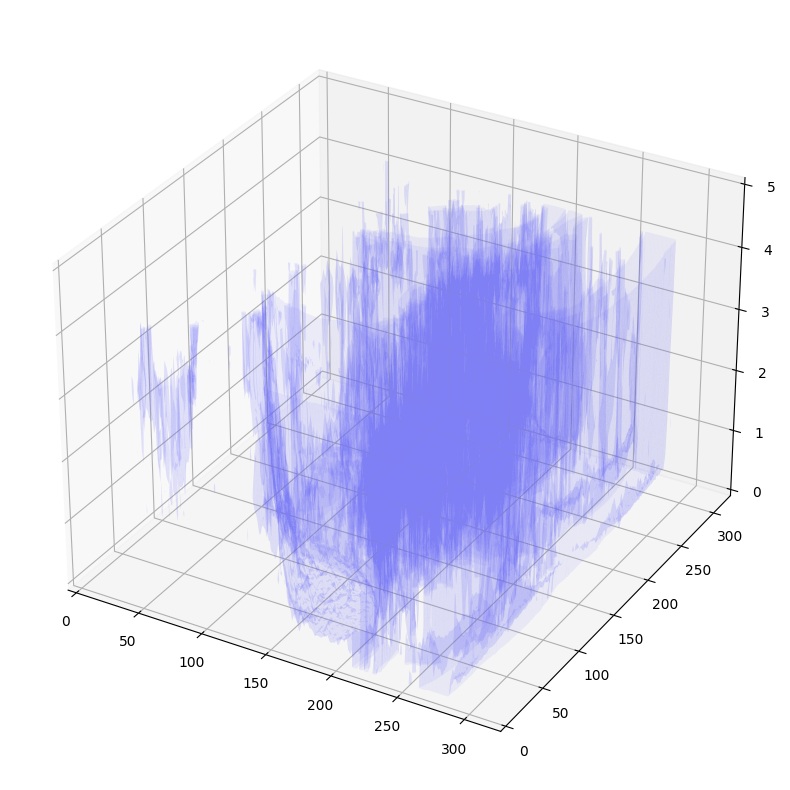

In [19]:
def load_dicom_images(folder_path, num_images=5):
    dicom_files = sorted([os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.dcm')])[:num_images]
    images = [pydicom.dcmread(f).pixel_array for f in dicom_files]
    return np.stack(images, axis=-1)

def plot_3d(image, threshold=-300):

    verts, faces, _, _ = measure.marching_cubes(image, level=threshold)  
    
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')    
    
    mesh = Poly3DCollection(verts[faces], alpha=0.1)
    face_color = [0.5, 0.5, 1]  # light blue
    mesh.set_facecolor(face_color)
    ax.add_collection3d(mesh)
    
    ax.set_xlim(0, image.shape[0])
    ax.set_ylim(0, image.shape[1])
    ax.set_zlim(0, image.shape[2])
    
    plt.show()


folder_path = "/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/100206310/1012284084"
dicom_images = load_dicom_images(folder_path, num_images=5)
plot_3d(dicom_images, threshold=300)


In [20]:
def load_dicom_images(folder_path, num_images=5):
    dicom_files = sorted([os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.dcm')])[:num_images]
    images = [pydicom.dcmread(f).pixel_array for f in dicom_files]
    return np.stack(images, axis=-1)

def plot_3d_interactive(image, threshold=-300):    
    verts, faces, _, _ = measure.marching_cubes(image, level=threshold)   
    
    fig = go.Figure(data=[
        go.Mesh3d(
            x=verts[:, 0],
            y=verts[:, 1],
            z=verts[:, 2],
            i=faces[:, 0],
            j=faces[:, 1],
            k=faces[:, 2],
            color='blue',
            opacity=0.1
        )
    ])
    
    fig.update_layout(
        scene=dict(
            xaxis=dict(visible=True),
            yaxis=dict(visible=True),
            zaxis=dict(visible=True)
        ),
        width=800,
        height=800,
        title="Interactive 3D DICOM Image Visualization"
    )
    
    fig.show()


folder_path = "/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/1002894806/866293114"
dicom_images = load_dicom_images(folder_path, num_images=5)
plot_3d_interactive(dicom_images, threshold=100)

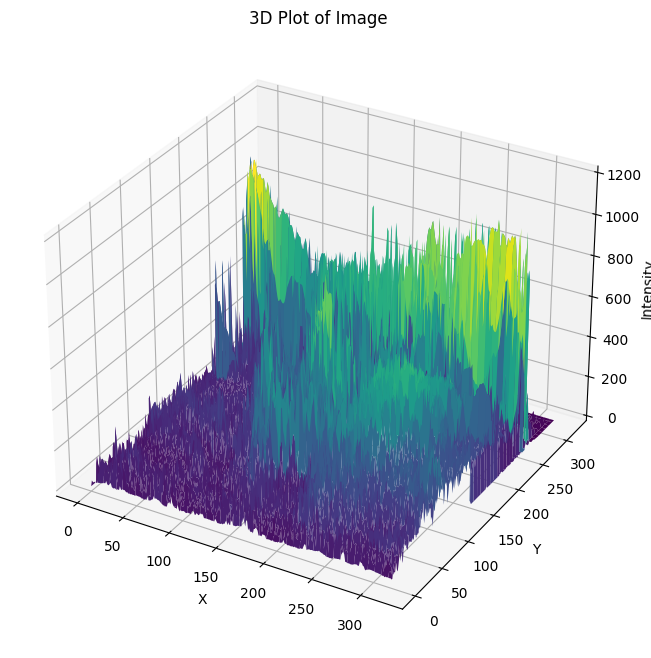

In [21]:
from mpl_toolkits.mplot3d import Axes3D

def plot_3d_image(image):   
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    rows, cols = image.shape
    x, y = np.meshgrid(np.arange(cols), np.arange(rows))
    ax.plot_surface(x, y, image, cmap='viridis', edgecolor='none')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Intensity')
    ax.set_title('3D Plot of Image')
    plt.show()
    
plot_3d_image(flair_images[0])

In [22]:
df_sub.head()

,row_id,normal_mild,moderate,severe
0,44036939_left_neural_foraminal_narrowing_l1_l2,0.333333,0.333333,0.333333
1,44036939_left_neural_foraminal_narrowing_l2_l3,0.333333,0.333333,0.333333
2,44036939_left_neural_foraminal_narrowing_l3_l4,0.333333,0.333333,0.333333
3,44036939_left_neural_foraminal_narrowing_l4_l5,0.333333,0.333333,0.333333
4,44036939_left_neural_foraminal_narrowing_l5_s1,0.333333,0.333333,0.333333


In [23]:
df_sub.shape,test_series.shape,train_series.shape,label_coordinates_df.shape,df_train.shape

((25, 4), (3, 3), (6294, 3), (48692, 7), (1975, 26))

In [24]:
test_series.head()

,study_id,series_id,series_description
0,44036939,2828203845,Sagittal T1
1,44036939,3481971518,Axial T2
2,44036939,3844393089,Sagittal T2/STIR


In [25]:
train_series.head()

,study_id,series_id,series_description
0,4003253,702807833,Sagittal T2/STIR
1,4003253,1054713880,Sagittal T1
2,4003253,2448190387,Axial T2
3,4646740,3201256954,Axial T2
4,4646740,3486248476,Sagittal T1


*  Reshape and Process Training Data
*  Creating a Target for Training
*   Creating a Test Data 

In [26]:
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier

In [27]:
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier

df_train_melted = df_train.melt(id_vars=['study_id'], var_name='condition_level', value_name='severity')
df_train_melted[['condition', 'level']] = df_train_melted['condition_level'].str.rsplit('_', n=2, expand=True).iloc[:, 1:]

le_severity = LabelEncoder()
df_train_melted['severity_encoded'] = le_severity.fit_transform(df_train_melted['severity'])

X_train = df_train_melted[['study_id', 'condition', 'level']]
y_train = df_train_melted['severity_encoded']

X_train = pd.get_dummies(X_train, columns=['condition', 'level'])
test_rows = []
for _, row in test_series.iterrows():
    for condition in ['left_neural_foraminal_narrowing', 'right_neural_foraminal_narrowing', 'left_subarticular_stenosis', 'right_subarticular_stenosis', 'spinal_canal_stenosis']:
        for level in ['l1_l2', 'l2_l3', 'l3_l4', 'l4_l5', 'l5_s1']:
            test_rows.append({
                'study_id': row['study_id'],
                'condition': condition,
                'level': level
            })

X_test = pd.DataFrame(test_rows)
X_test = pd.get_dummies(X_test, columns=['condition', 'level'])
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

In [28]:
X_train

,study_id,condition_l1,condition_l2,condition_l3,condition_l4,condition_l5,level_l2,level_l3,level_l4,level_l5,level_s1
0,4003253,True,False,False,False,False,True,False,False,False,False
1,4646740,True,False,False,False,False,True,False,False,False,False
2,7143189,True,False,False,False,False,True,False,False,False,False
3,8785691,True,False,False,False,False,True,False,False,False,False
4,10728036,True,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...
49370,4282019580,False,False,False,False,True,False,False,False,False,True
49371,4283570761,False,False,False,False,True,False,False,False,False,True
49372,4284048608,False,False,False,False,True,False,False,False,False,True
49373,4287160193,False,False,False,False,True,False,False,False,False,True


In [29]:
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [30]:
predictions_proba = model.predict_proba(X_test)
predictions_df = pd.DataFrame(predictions_proba, columns=le_severity.classes_)
predictions_df['study_id'] = X_test['study_id'].values
predictions_df['condition_level'] = X_test.index.map(lambda idx: f"{test_rows[idx]['condition']}_{test_rows[idx]['level']}")
predictions_df['row_id'] = predictions_df['study_id'].astype(str) + '_' + predictions_df['condition_level']

In [31]:
df_sub1 = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/sample_submission.csv')

In [32]:
normal_mild_value = predictions_df['Normal/Mild'].iloc[0]
moderate_value = predictions_df['Moderate'].iloc[0]
severe_value = predictions_df['Severe'].iloc[0]

df_sub['normal_mild'] = (normal_mild_value+df_sub1['normal_mild'])/2
df_sub['moderate'] =(moderate_value+df_sub1['moderate'])/2
df_sub['severe'] = severe_value+df_sub1['severe']/2

In [33]:
df_sub.sample(4)

,row_id,normal_mild,moderate,severe
11,44036939_right_neural_foraminal_narrowing_l2_l3,0.59089,0.242444,0.166667
8,44036939_left_subarticular_stenosis_l4_l5,0.59089,0.242444,0.166667
24,44036939_spinal_canal_stenosis_l5_s1,0.59089,0.242444,0.166667
23,44036939_spinal_canal_stenosis_l4_l5,0.59089,0.242444,0.166667


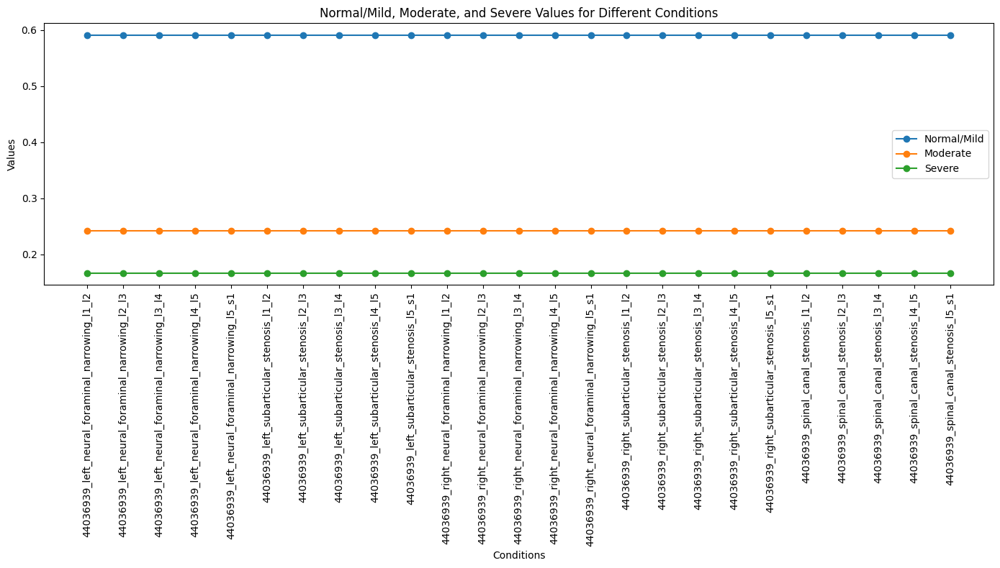

In [34]:
plt.figure(figsize=(14, 8))
plt.plot(df_sub['row_id'], df_sub['normal_mild'], label='Normal/Mild', marker='o')
plt.plot(df_sub['row_id'], df_sub['moderate'], label='Moderate', marker='o')
plt.plot(df_sub['row_id'], df_sub['severe'], label='Severe', marker='o')

plt.xlabel('Conditions')
plt.ylabel('Values')
plt.title('Normal/Mild, Moderate, and Severe Values for Different Conditions')
plt.xticks(rotation=90)
plt.legend()

plt.tight_layout()
plt.show()

In [35]:
df_sub.to_csv('submission.csv', index=False)

# Thank You 